In [1]:
import numpy as np 
from PIL import Image
from pathlib import Path 
from tqdm import tqdm

In [6]:
def get_images() -> tuple[np.ndarray, np.ndarray]:
    def get_images_as_array(root_dir, extension: str="png") -> np.ndarray:
        paths = list(Path(root_dir).rglob(f"*.{extension}"))
        images = [np.array(Image.open(img_path)) for img_path in tqdm(paths)]
        return np.array(images)

    ck_dataset_dir = Path().absolute().parents[0] / "data/dataset_2023_03_26"
    print("trying to load ck dataset from :", ck_dataset_dir)
    ck_dataset_fname = Path().absolute().parents[0] / "data/ck_dataset.npy"
    if ck_dataset_fname.exists():
        ck_images = np.load(ck_dataset_fname)
    else:
        ck_images = get_images_as_array(ck_dataset_dir)
        np.save(ck_dataset_fname, ck_images)

    lfw_dataset_dir = Path().absolute().parents[0] / "data/lfw"
    print("trying to load lfw dataset from :", lfw_dataset_dir)
    lfw_dataset_fname = Path().absolute().parents[0] / "data/lfw_subset.npy"
    if lfw_dataset_fname.exists():
        lfw_images = np.load(lfw_dataset_fname)
    else:
        lfw_images = get_images_as_array(lfw_dataset_dir, "jpg")
        np.save(lfw_dataset_fname, lfw_images)

    return ck_images, lfw_images

ck_images, lfw_images = get_images()


trying to load ck_dataset from : /Users/czyjtu/dev/MP2023/data/dataset_2023_03_26
trying to load lfw dataset from : /Users/czyjtu/dev/MP2023/data/lfw


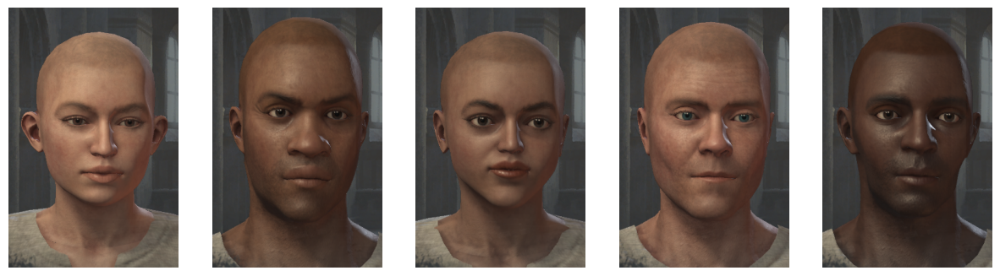

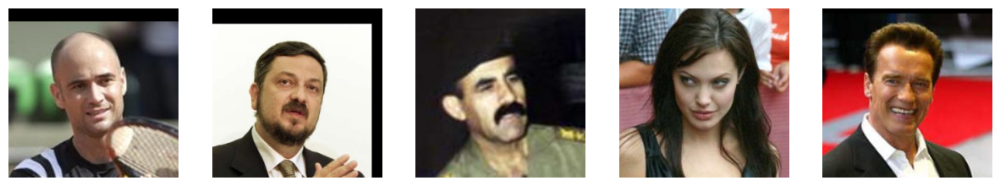

In [7]:
import matplotlib.pyplot as plt
import random

def display_samples(images, n_samples=5):
    fig, axs = plt.subplots(1, n_samples, figsize=(15, 15))
    for i in range(n_samples):
        axs[i].imshow(images[random.randint(0, len(images))])
        axs[i].axis("off")
    plt.show()

display_samples(ck_images)
display_samples(lfw_images)

# Calculate embeddings 

In [11]:
# calculate embeddings using insightface 
import insightface
import numpy as np
from tqdm import tqdm

def calculate_embeddings(images: list[Path] | np.ndarray):
    if isinstance(images, list):
        images = np.array([np.array(Image.open(path))[:, :, :3]  for path in images])

    insight_face_app = insightface.app.FaceAnalysis(name="antelopev2")
    insight_face_app.prepare(ctx_id = 0, det_thresh = 0.3)
    embeddings = [dict(insight_face_app.get(im)[0])["embedding"] for im in tqdm(images)]

    return np.array(embeddings)

N = 2000
np.random.seed(42)
ck_embeddings_fname = Path().absolute().parent / f"data/ck_embeddings_top{N}_rand.npy"
lfw_embeddings_fname = Path().absolute().parent / f"data/lfw_embeddings_top{N}.npy"

try:
    ck_embeddings = np.load(ck_embeddings_fname)
    lfw_embeddings = np.load(lfw_embeddings_fname)
except FileNotFoundError:
    ck_sample = np.random.choice(np.arange(ck_images.shape[0]), N)
    ck_embeddings = calculate_embeddings(ck_images[ck_sample])
    lfw_embeddings = calculate_embeddings(lfw_images[: N])

    np.save(ck_embeddings_fname, ck_embeddings)
    np.save(lfw_embeddings_fname, lfw_embeddings)

# Visualize embeddings 

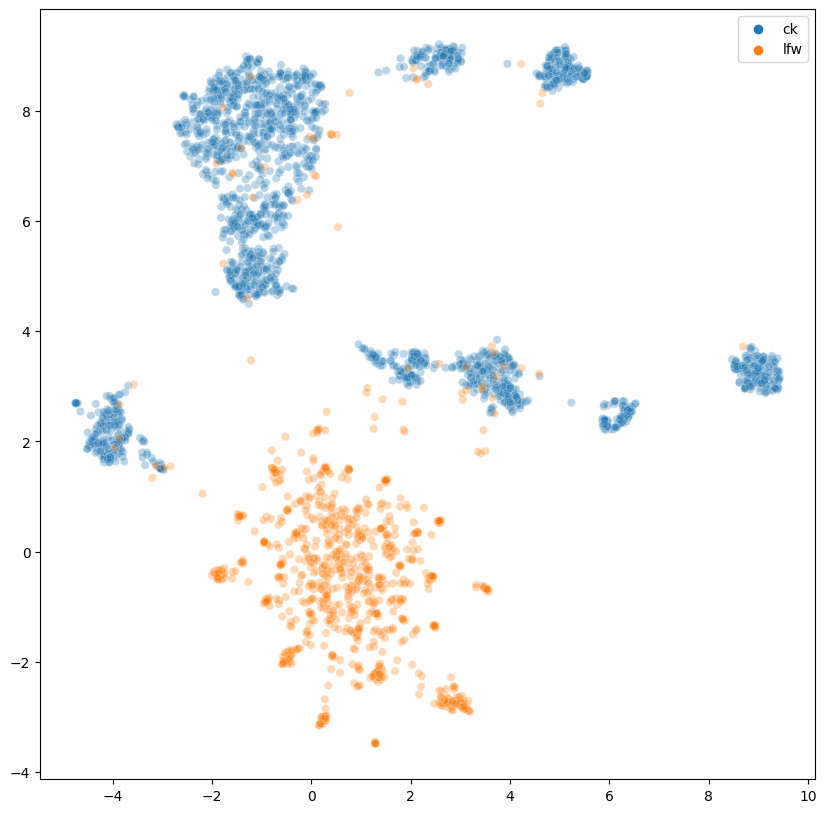

In [12]:
# visualize embeddings using UMAP
import umap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


X = np.concatenate([ck_embeddings, lfw_embeddings])
X = X / np.linalg.norm(X, axis=1, keepdims=True)
y = np.array(["ck"] * ck_embeddings.shape[0] + ["lfw"] * lfw_embeddings.shape[0])

reducer = umap.UMAP(metric="cosine")
embeddings_2d = reducer.fit_transform(X)

plt.figure(figsize=(10, 10))
sns.scatterplot(
    x=embeddings_2d[:, 0], y=embeddings_2d[:, 1], hue=y, legend="full", alpha=0.3
)
plt.show()

## clustering

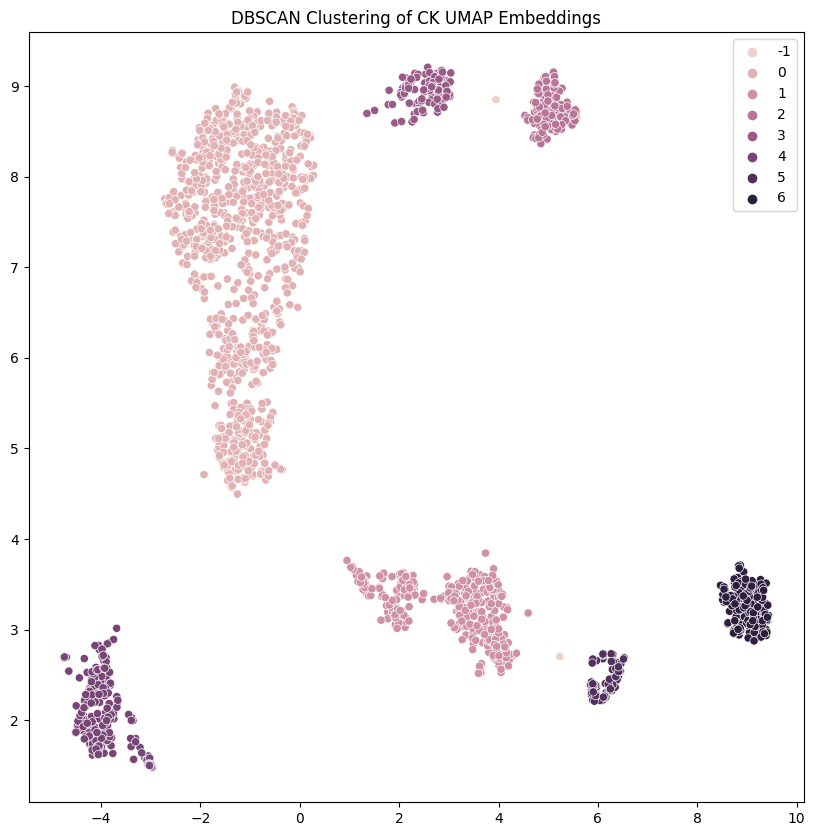

In [22]:
from sklearn.cluster import DBSCAN

ck_embeddings_2d = embeddings_2d[y == "ck"]

dbscan = DBSCAN(eps=0.5, min_samples=10)
dbscan_ck_labels = dbscan.fit_predict(ck_embeddings_2d)

plt.figure(figsize=(10, 10))
sns.scatterplot(
    x=ck_embeddings_2d[:, 0], y=ck_embeddings_2d[:, 1], hue=dbscan_ck_labels, legend="full", alpha=1
)
plt.title("DBSCAN Clustering of CK UMAP Embeddings")
plt.show()

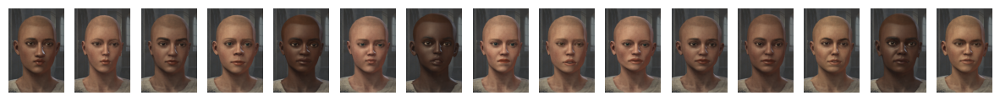

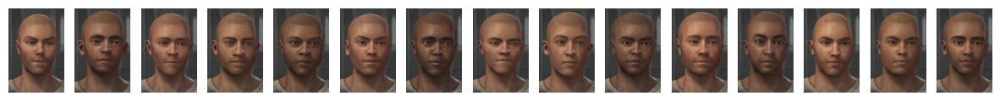

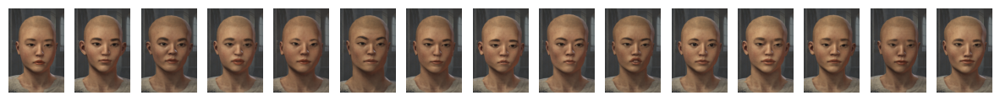

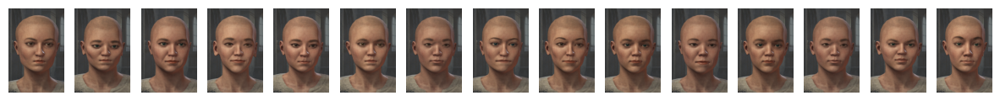

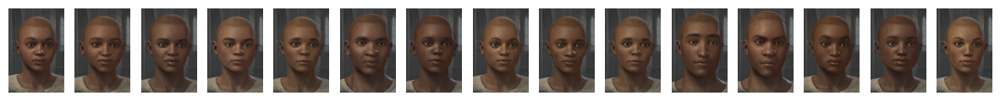

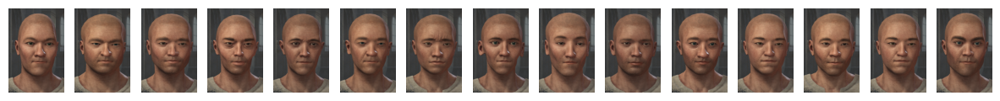

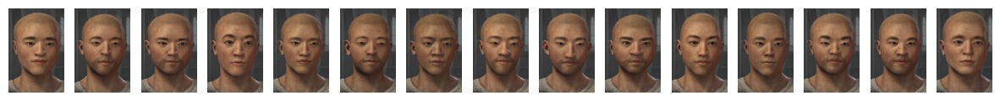

In [28]:
for label in set(dbscan_ck_labels) - {-1}:
    cluster_images = ck_images[ck_sample][dbscan_ck_labels == label]
    display_samples(cluster_images, n_samples=15)

# Display clossest fake-real pairs

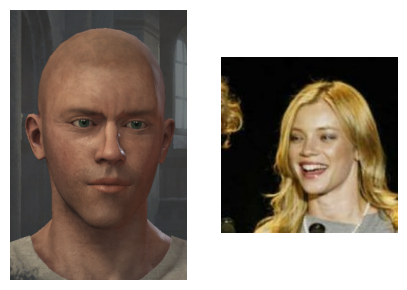

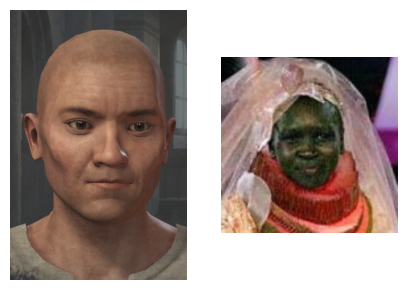

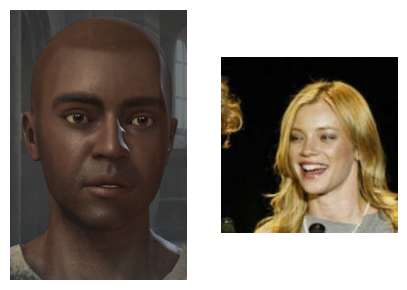

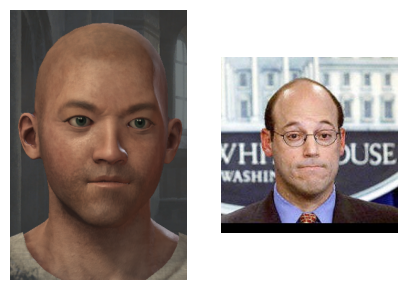

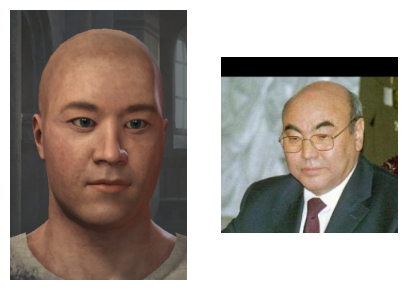

...

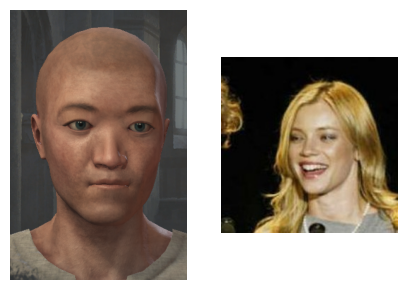

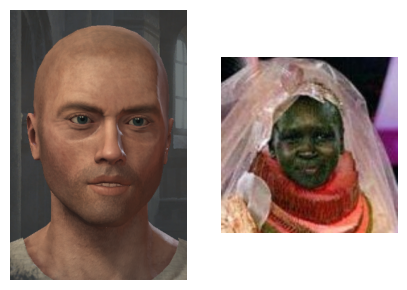

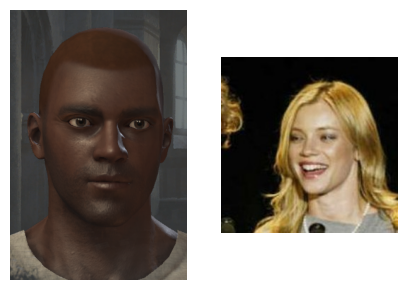

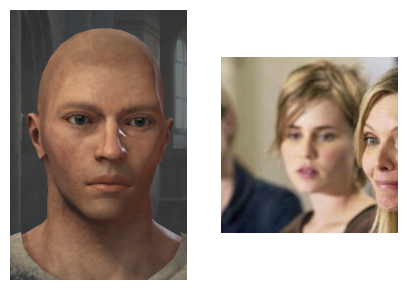

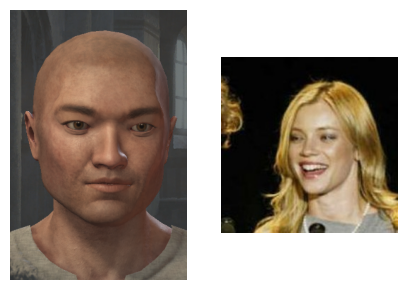

In [33]:
# get closest pairs of images that are from two different datasets
from scipy.spatial.distance import cdist
from tqdm import tqdm

def get_closest_pairs(embeddings_1, embeddings_2, n_pairs=5):
    distances = cdist(embeddings_1, embeddings_2, metric="cosine")
    min_distances = np.min(distances, axis=1)
    min_rows = np.argsort(min_distances)[:n_pairs]
    min_cols = np.argmin(distances[min_rows], axis=1)
    closest_pairs = list(zip(min_rows, min_cols))
    return closest_pairs

closest_pairs = get_closest_pairs(ck_embeddings, lfw_embeddings, n_pairs=25)
for ck_idx, lfw_idx in closest_pairs:
    ck_img = ck_images[ck_idx]
    lfw_img = lfw_images[lfw_idx]
    fig, axs = plt.subplots(1, 2, figsize=(5, 10))
    axs[0].imshow(ck_img)
    axs[0].axis("off")
    axs[1].imshow(lfw_img)
    axs[1].axis("off")
    plt.show()

# Which features are the most distinguishing?

In [29]:
# use RFE to get the most important features using SVC
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

n_features = int(X.shape[1] / 2)
svc = SVC(kernel="linear", C=1)
rfe = RFE(estimator=svc, n_features_to_select=n_features, step=1)
rfe.fit(X, y)

print("Num Features: %d" % rfe.n_features_)
print("Selected Features: %s" % rfe.support_)
print("Feature Ranking: %s" % rfe.ranking_)

Num Features: 256
Selected Features: [ True  True  True False  True  True False False False False False False
 False  True  True False  True False False False  True False  True False
  True False  True False  True False False False False False  True  True
  True False  True False  True False False  True  True  True False False
  True False False False  True  True  True  True  True False  True  True
  True  True  True  True False False False False False  True  True  True
 False  True  True  True False False False  True False  True False False
  True False  True False False  True  True False  True False False  True
 False  True False False False  True False False  True  True  True  True
  True  True  True  True  True  True  True False  True False  True False
 False  True  True  True  True False  True  True  True False False False
  True False  True  True False False False  True False  True  True  True
  True False False  True False  True False False False False False False
  True  True  

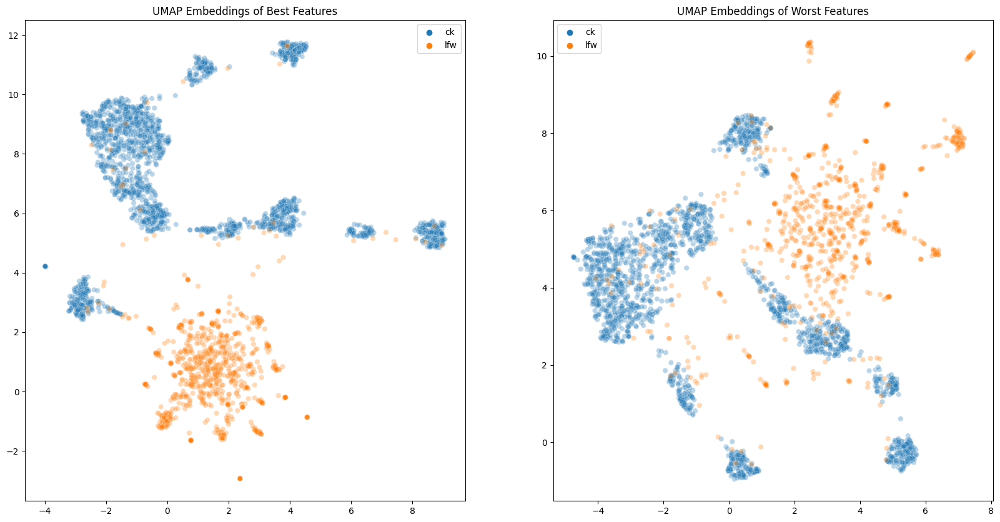

In [30]:
best_features, worst_features = rfe.support_, ~rfe.support_
X_best, X_worst = X[:, best_features], X[:, worst_features]

# display umap embeddings of best and worst features
reducer = umap.UMAP(metric="cosine")
embeddings_2d_best = reducer.fit_transform(X_best)
embeddings_2d_worst = reducer.fit_transform(X_worst)

fig, axs = plt.subplots(1, 2, figsize=(20, 10))
sns.scatterplot(
    x=embeddings_2d_best[:, 0], y=embeddings_2d_best[:, 1], hue=y, legend="full", alpha=0.3, ax=axs[0]
)
sns.scatterplot(
    x=embeddings_2d_worst[:, 0], y=embeddings_2d_worst[:, 1], hue=y, legend="full", alpha=0.3, ax=axs[1]
)
axs[0].set_title("UMAP Embeddings of Best Features")
axs[1].set_title("UMAP Embeddings of Worst Features")
plt.show()

## Closest fake-real pairs for worst features

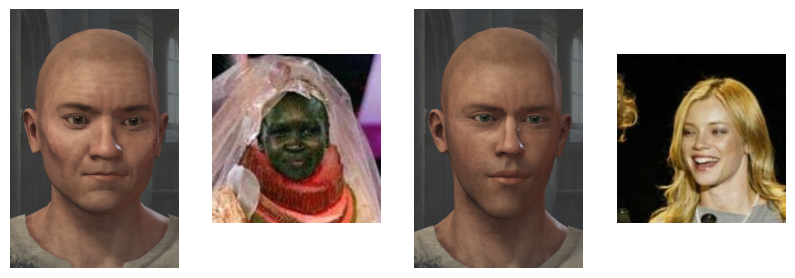

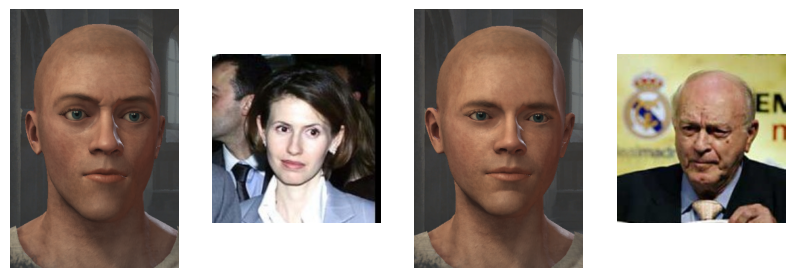

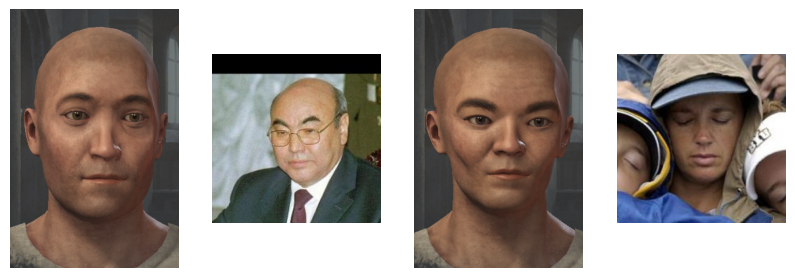

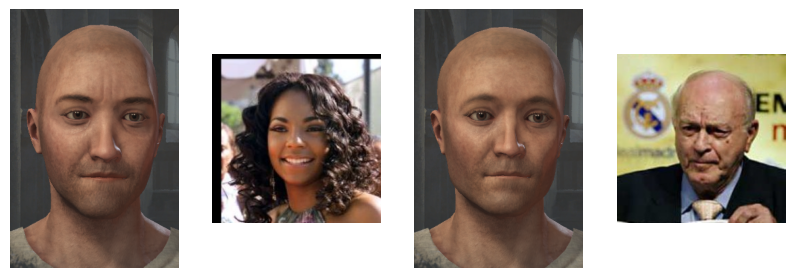

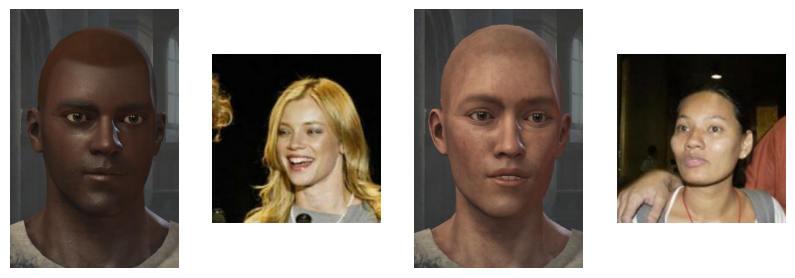

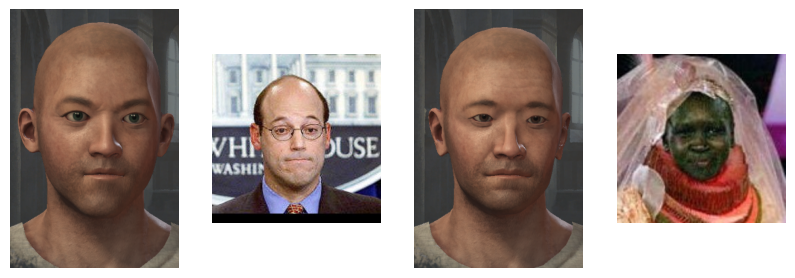

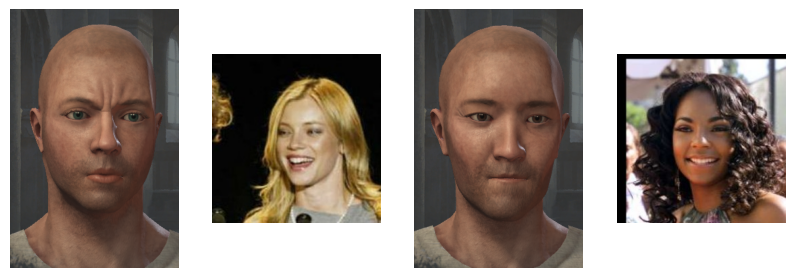

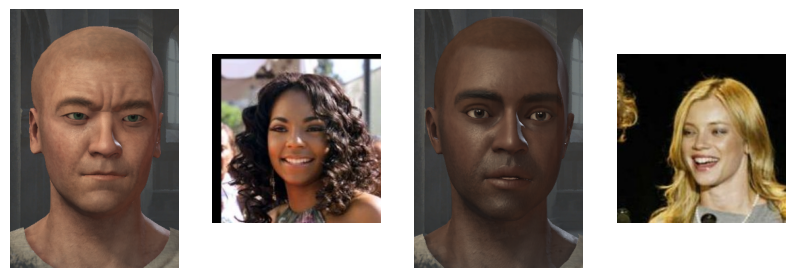

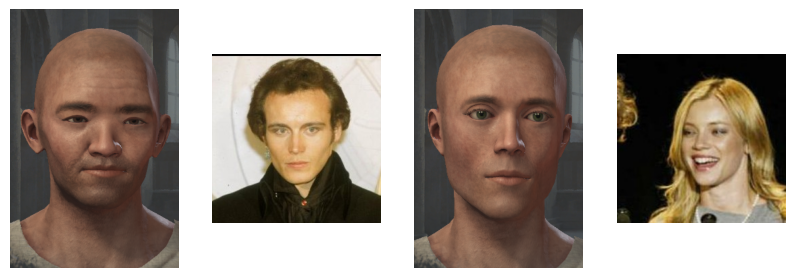

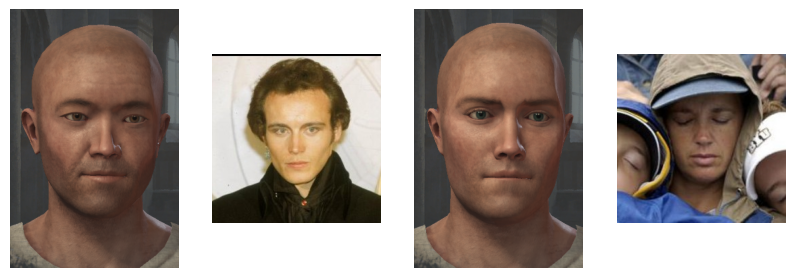

In [32]:
closest_pairs_worst = get_closest_pairs(ck_embeddings[:, worst_features], lfw_embeddings[:, worst_features], n_pairs=10)
closest_pairs_best = get_closest_pairs(ck_embeddings[:, best_features], lfw_embeddings[:, best_features], n_pairs=10)

for (ck_idx_w, lfw_idx_w), (ck_idx_b, lfw_idx_b) in zip(closest_pairs_worst, closest_pairs_best):
    ck_img_w = ck_images[ck_idx_w]
    lfw_img_w = lfw_images[lfw_idx_w]
    ck_img_b = ck_images[ck_idx_b]
    lfw_img_b = lfw_images[lfw_idx_b]
    fig, axs = plt.subplots(1, 4, figsize=(10, 10))
    axs[0].imshow(ck_img_w)
    axs[0].axis("off")
    axs[1].imshow(lfw_img_w)
    axs[1].axis("off")
    axs[2].imshow(ck_img_b)
    axs[2].axis("off")
    axs[3].imshow(lfw_img_b)
    axs[3].axis("off")
    plt.show()